# <font color = '#e64626'><center>Predict listing prices for Airbnb properties in Australia</center></font>

### Code instruction

1. All the packages used in this study are listed in "Import packages" section below. If any packages are not installed, please use the command **!pip install package_name** to install them. Please update the package version if needed.

2. Run the code cells sequentially, following the instructions and comments provided within the notebook.

# Table of Contents

1. [Data Processing](#data_processing)
2. [Exploratory Data Analysis](#eda)
3. [Feature Engineering](#feature_engineering)
4. [Methodology](#methodology)
<br> 4.1 [Model 1: *Lasso Regression*](#model_1)
<br> 4.2 [Model 2: *Decision Tree*](#model_2)
<br> 4.3 [Model 3: *Stacking Model*](#model_3)

In [3]:
# Please ignore this cell. It's used by Ed workspaces to access the data files for groups wanting to use the Ed workspaces.

! [ -v ED_COURSE_ID ] && [[ ! -f test.csv ]] && ln -s /course/data/test.csv
! [ -v ED_COURSE_ID ] && [[ ! -f train.csv ]] && ln -s /course/data/train.csv

### Import packages

In [4]:
import numpy as np
import pandas as pd
import folium
import math

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import re
import ast
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.linear_model import Lasso, LinearRegression
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor, StackingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import time
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.inspection import permutation_importance
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords



In [5]:
rc = {"xtick.labelsize": 12, "ytick.labelsize": 12, "axes.labelsize": 15,
      "axes.titlesize": 15, "legend.fontsize": 12}
sns.set_context("notebook", rc=rc)

## <font color = '#e64626'><a id='data_processing'>1. Data Processing</a></font>

In [6]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

response = 'price'

y_train_complete = train[response]

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           12500 non-null  int64  
 1   price                        12500 non-null  int64  
 2   description                  12500 non-null  object 
 3   neighborhood_overview        12500 non-null  object 
 4   host_acceptance_rate         12500 non-null  float64
 5   neighbourhood                12500 non-null  object 
 6   latitude                     12500 non-null  float64
 7   longitude                    12500 non-null  float64
 8   property_type                12500 non-null  object 
 9   room_type                    12500 non-null  object 
 10  accommodates                 12500 non-null  int64  
 11  bedrooms                     12500 non-null  float64
 12  beds                         12498 non-null  float64
 13  amenities       

In [5]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           2500 non-null   int64  
 1   description                  2500 non-null   object 
 2   neighborhood_overview        2500 non-null   object 
 3   host_acceptance_rate         2500 non-null   float64
 4   neighbourhood                2500 non-null   object 
 5   latitude                     2500 non-null   float64
 6   longitude                    2500 non-null   float64
 7   property_type                2500 non-null   object 
 8   room_type                    2500 non-null   object 
 9   accommodates                 2500 non-null   int64  
 10  bedrooms                     2500 non-null   float64
 11  beds                         2500 non-null   float64
 12  amenities                    2500 non-null   object 
 13  minimum_nights    

### Pre-processes the amenity column

In [7]:
# Define a replacement dictionary
replacements = {
    r'hdtv.*': "hdtv",
    r'coffee.*|espresso': "coffee_maker",
    r'kitchen': 'kitchen',
    r'somke|smoke alarm' :  "somke_alarm",
    r'workspace' :"work space",
    r'barbecue|BBQ|grill|griller|grills': "bbq",
    r'bed|pillows': "bed",
    r"fireplace" : "fireplace",
    r'air conditioning|ductless system|AC unit': "air_conditioning",
    r'dryer.*|hair dryer.*|free dryer.*|paid dryer.*': "dryer",
    r'washer|laundry': "washer",
    r'mircro|microwave': "microwave",
    r'hot water':'hot_water',
    r'dishwasher|dishes': "dishwasher",
    r'clothing': "clothing_storage",
    r'game|board games': "entertainment",
    r'shampoo|soap|shower|body|wash|skin|bath': "bathroom_essentials",
    r'refrigerator|freezer|fridge': "refrigerator",
    r'paid parking|paid carport|paid garage': "paid parking",
    r'free parking|free carport|free garage|parking|carport|garage': "free_parking",
    r'oven|cooking': "cooking",
    r'self check-in|self check-out|self check' : "self_check",
    r'tv': "tv",
    r'wifi': "wifi",
    r'children': "children_care",
    r'sound system': "sound_system",
    r'beach': "beach",
    r'stove|kettle': "stove",
    r'iron': "iron",
    r'backyard': "backyard",
    r'baby': "baby_care",
    r'crib': "crib",
    r'exercise|gym': "exercise",
    r'conditioner': "conditioner",
    r'pool': "pool",
    r'chair' : "chair",
    r'table' : "table",
    r'bread|toast' : "bread_maker",
    r"first aid|aid" : "first_aid",
    r'tub' : "tub",
    r"grill|griller" : "grill",
    r"rooftop|roof|ceiling" : "roof",
    r"and" : "",
    r"view" : "outstanding_view",
    r"balcony|balconical": "balcony",
    r"pets" : "pets",
    r'gas' : "gas",
    r'ski' : "ski",
    r'netflix|disney|video' : "Satisfing_Channels",
    r"heater" : "heater",
    r"security|cameras|safe": "security",
    r"hangers|hang" : "hangers",
    r"fireplace": "Fireplace",
    r"book": "Book",
    r"greet": "Greeting",
    r"sauna": "Sauna",
    r"long term.*": "Long_term_stay"
}

# Combines all patterns in the replacement dictionary
pattern = re.compile(r'(' + '|'.join(replacements.keys()) + r')', re.IGNORECASE)

# Function to replace matched patterns in amenities
def replace_amenities(amenity_str):
    amenities_list = ast.literal_eval(amenity_str)
    standardized_amenities = []
    for item in amenities_list:
        standardized_item = item
        for pattern, replacement in replacements.items():
            if re.search(pattern, item, re.IGNORECASE):
                standardized_item = replacement
                break
        standardized_amenities.append(standardized_item)
    return standardized_amenities

# Apply the replacement to the "amenities" column
train['standardized_amenities'] = train['amenities'].apply(replace_amenities)
test['standardized_amenities'] = test['amenities'].apply(replace_amenities)

In [8]:
# Find unique values in 'standardized_amenities'
unique_amenities = train['amenities'].str.split(',').explode().unique()
print(f"The number of unique amenities appeared in the original amenities: {len(unique_amenities)}")


# Find unique values in 'standardized_amenities'
unique_standardized_amenities = train['standardized_amenities'].explode().unique()
print(f"The number of unique amenities appeared in standardized amenities: {len(unique_standardized_amenities)}")

The number of unique amenities appeared in the original amenities: 4832
The number of unique amenities appeared in standardized amenities: 98


#### Map the Property type

In [9]:
property_type_mapping = {
    'Entire guesthouse': 'Entire House',
    'Entire rental unit': 'Entire Apartments',
    'Entire bungalow': 'Entire House',
    'Private room in guest suite': 'Private Accommodations',
    'Tent': 'Camping',
    'Entire home': 'Entire House',
    'Entire guest suite': 'Private Accommodations',
    'Entire townhouse': 'Entire House',
    'Private room in guesthouse': 'Private Accommodations',
    'Entire condo': 'Entire House',
    'Entire cottage': 'Entire House',
    'Entire villa': 'Entire House',
    'Entire chalet': 'Entire House',
    'Room in hotel': 'Hotels',
    'Entire vacation home': 'Entire House',
    'Entire loft': 'Entire Apartments',
    'Entire cabin': 'Entire House',
    'Private room in home': 'Private Accommodations',
    'Farm stay': 'Special Stays',
    'Entire serviced apartment': 'Entire Apartments',
    'Room in boutique hotel': 'Hotels',
    'Private room': 'Private Accommodations',
    'Tiny home': 'Special Stays',
    'Shipping container': 'Special Stays',
    'Private room in rental unit': 'Private Accommodations',
    'Campsite': 'Camping',
    'Yurt': 'Camping',
    'Room in serviced apartment': 'Private Accommodations',
    'Private room in serviced apartment': 'Private Accommodations',
    'Barn': 'Entire House',
    'Earthen home': 'Special Stays',
    'Entire place': 'Entire House',
    'Camper/RV': 'Camping',
    'Train': 'Special Stays',
    'Private room in hostel': 'Private Accommodations',
    'Private room in townhouse': 'Private Accommodations',
    'Room in bed and breakfast': 'Private Accommodations',
    'Private room in loft': 'Private Accommodations',
    'Room in hostel': 'Private Accommodations',
    'Room in aparthotel': 'Private Accommodations',
    'Holiday park': 'Camping',
    'Boat': 'Special Stays',
    'Ranch': 'Entire House',
    'Bus': 'Special Stays',
    'Entire bed and breakfast': 'Entire House',
    'Private room in tipi': 'Private Accommodations',
    'Private room in camper/rv': 'Private Accommodations',
    'Private room in tent': 'Private Accommodations',
    'Nature lodge': 'Special Stays',
    'Hut': 'Special Stays',
    'Private room in condo': 'Private Accommodations',
    'Treehouse': 'Special Stays',
    'Private room in resort': 'Private Accommodations',
    'Private room in farm stay': 'Private Accommodations',
    'Dome': 'Special Stays',
    'Private room in nature lodge': 'Private Accommodations',
    'Castle': 'Special Stays',
    'Private room in bed and breakfast': 'Private Accommodations',
    'Room in resort': 'Hotels',
    'Private room in bungalow': 'Private Accommodations',
    'Tipi': 'Camping',
    'Floor': 'Private Accommodations',
    'Private room in yurt': 'Camping'
}

# Standardise the property type
train['standardized_property_type'] = train['property_type'].map(property_type_mapping)
test['standardized_property_type'] = test['property_type'].map(property_type_mapping)

## <font color = '#e64626'><a id='eda'>2. Exploratory Data Analysis</a></font>

The example provided here is to show you how to save figures of an appropriate resolution by using <tt>dpi</tt>. The <tt>bbox_inches='tight'</tt> is used to ensure that when your figure is saved, there are no cropping issues. In the example, the figure is saved as a <tt>.png</tt>, but you may also want to save your figures as a <tt>.pdf</tt>.

When you produce figures, make sure that all axes labels are readable. This notebook has been setup so that in general, the fontsizes are readable. These are defined in cell [2].

You can change the dimensions of the figure by changing the `figsize`.

### 2.1 Response variable (Price)

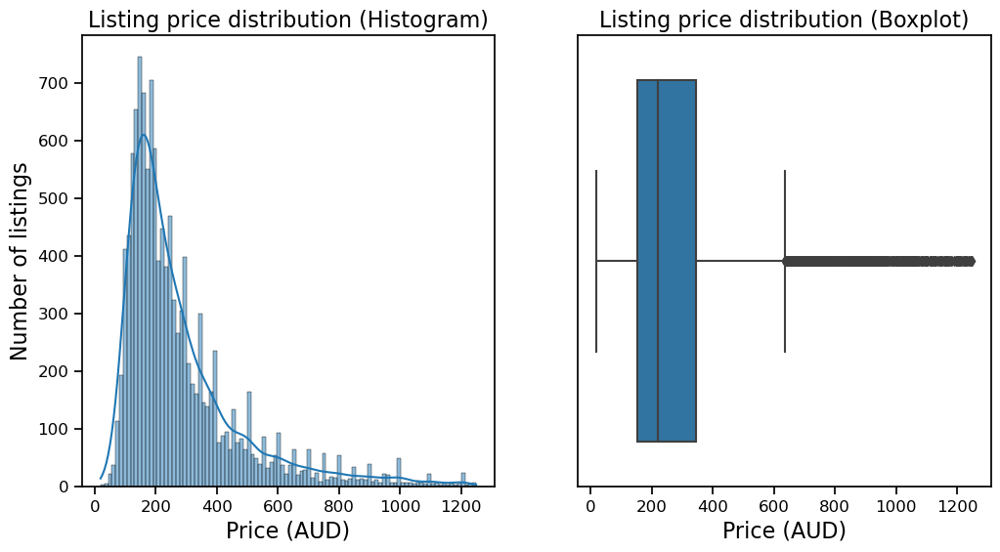

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=y_train_complete, kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Price (AUD)", fontsize=16)
axes[0].set_ylabel("Number of listings", fontsize=16)
axes[0].set_title("Listing price distribution (Histogram)", fontsize=16)

# Create a boxplot
sns.boxplot(data = y_train_complete, orient="h", ax=axes[1])
axes[1].set_xlabel("Price (AUD)", fontsize=16)
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Listing price distribution (Boxplot)", fontsize=16)

plt.show()


### 2.2 Property and Room Type
**Room Type**

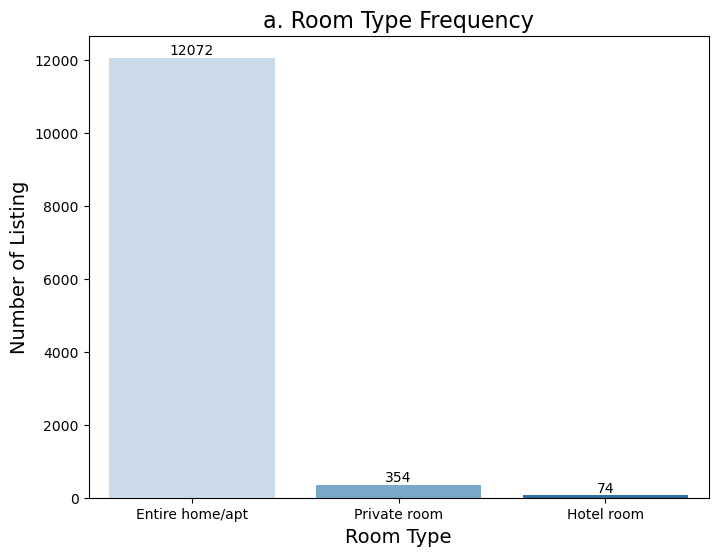

In [26]:
# Calculate the frequency of each room type
room_type_count = train['room_type'].value_counts()

# Create the color palette from the violin plot's palette
palette = sns.color_palette('Blues', len(room_type_count))

# Create the bar chart
plt.figure(figsize=(8, 6))
sns.barplot(x=room_type_count.index, y=room_type_count, palette=palette)

# Add count labels to the bars
for i, count in enumerate(room_type_count):
    plt.text(i, count, str(count), ha='center', va='bottom', color='black')

# Set the labels and title
plt.xlabel('Room Type', fontsize=14)
plt.ylabel('Number of Listing', fontsize=14)
plt.title('a. Room Type Frequency', fontsize=16)

plt.show()

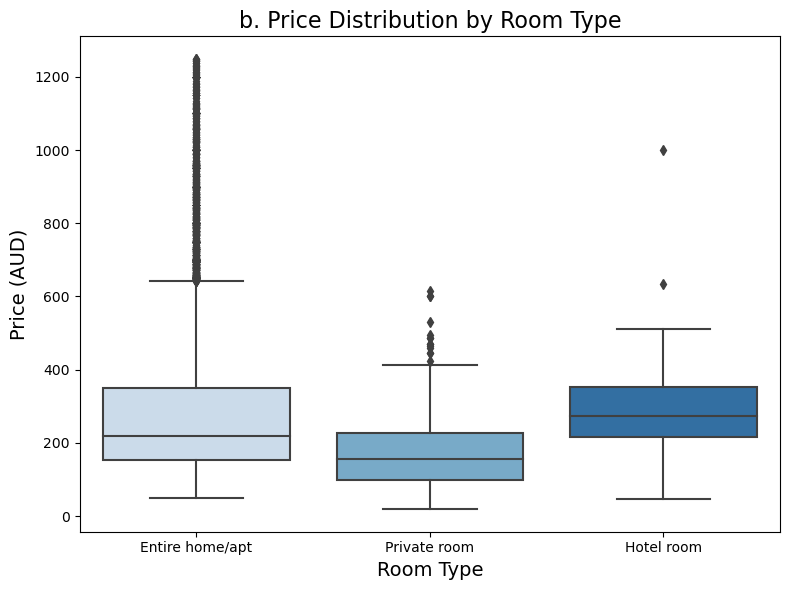

In [27]:
# Calculate the mean price for each room type
room_type_mean_prices = train.groupby('room_type')['price'].mean()

# Define the order of room types
room_type_order = ['Entire home/apt', 'Private room', 'Hotel room']

plt.figure(figsize=(8, 6))

# violin plot with specified room type order
sns.boxplot(data=train, x='room_type', y='price', palette='Blues', order=room_type_order)

plt.xlabel('Room Type', fontsize=14)
plt.ylabel('Price (AUD)', fontsize=14)
plt.title('b. Price Distribution by Room Type', fontsize=16)
plt.tight_layout()

plt.show()

**Property type**

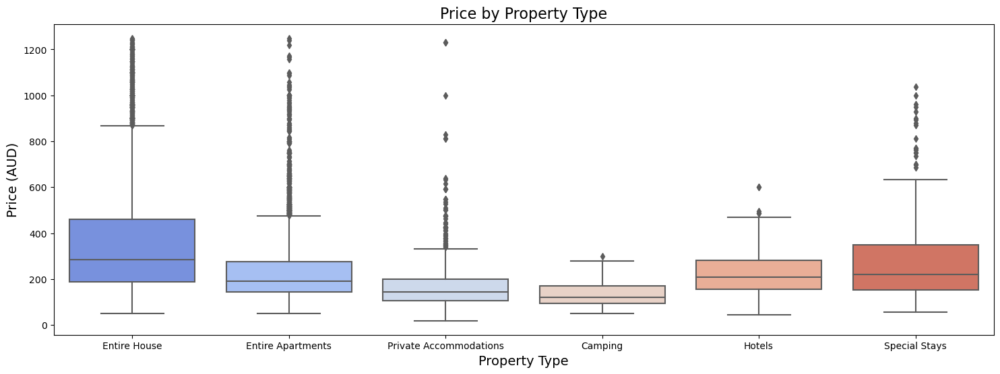

In [24]:
# Create a boxplot for each sentiment category
plt.figure(figsize=(18, 6))
sns.boxplot(data=train, x="standardized_property_type", y="price", palette='coolwarm')

# Add labels and title
plt.xlabel("Property Type", fontsize=14)
plt.ylabel("Price (AUD)", fontsize=14)
plt.title("Price by Property Type", fontsize=16)

plt.show()

### 2.3 Accommodates, Bedrooms, and Beds 

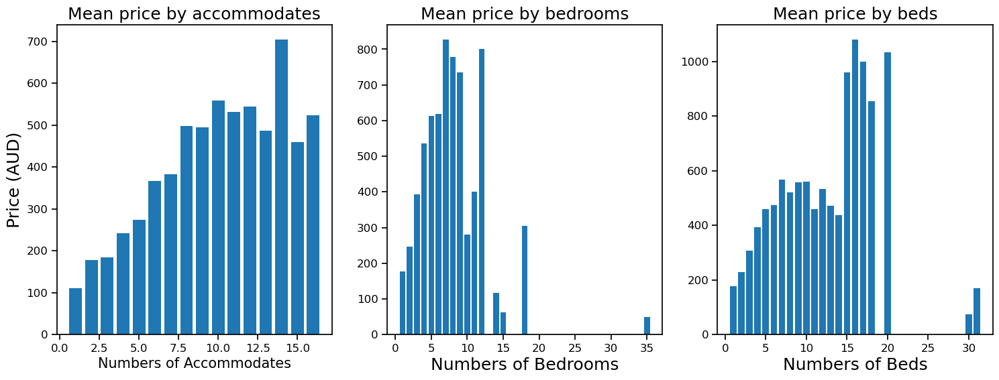

In [10]:
# mean prices
accommodates_mean_price = train.groupby("accommodates")['price'].mean().sort_values(ascending=False)
bedrooms_mean_price = train.groupby("bedrooms")['price'].mean().sort_values(ascending=False)
beds_mean_price = train.groupby("beds")['price'].mean().sort_values(ascending=False)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# accommodates
axes[0].bar(accommodates_mean_price.index, accommodates_mean_price)
axes[0].set_xlabel("Numbers of Accommodates")
axes[0].set_ylabel("Price (AUD)", fontsize = 18)
axes[0].set_title("Mean price by accommodates", fontsize = 18)

# bedrooms
axes[1].bar(bedrooms_mean_price.index, bedrooms_mean_price)
axes[1].set_xlabel("Numbers of Bedrooms", fontsize = 18)
axes[1].set_title("Mean price by bedrooms", fontsize = 18)

# beds
axes[2].bar(beds_mean_price.index, beds_mean_price)
axes[2].set_xlabel("Numbers of Beds", fontsize = 18)
axes[2].set_title("Mean price by beds", fontsize = 18)

plt.show()

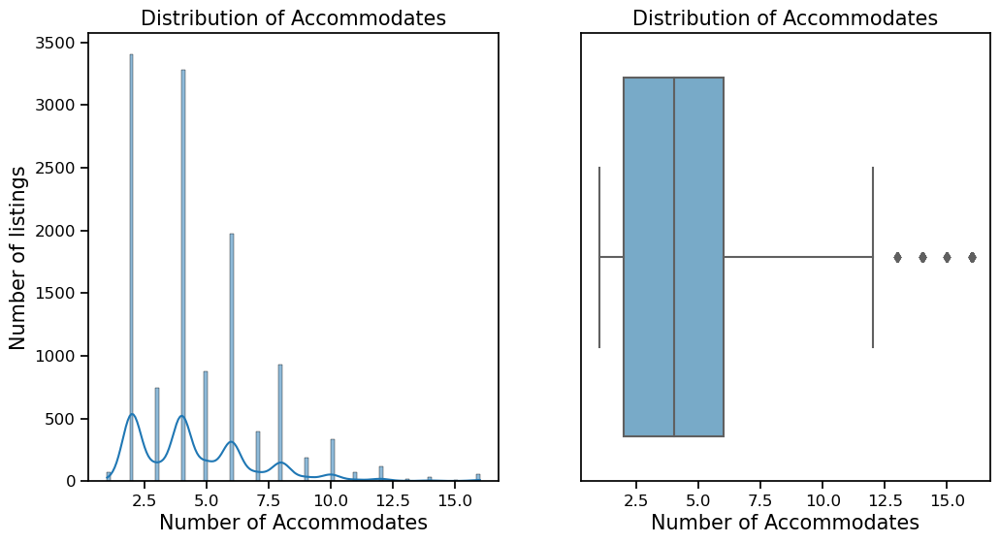

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["accommodates"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Number of Accommodates")
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of Accommodates")

# Create a boxplot
sns.boxplot(data = train["accommodates"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel("Number of Accommodates")
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of Accommodates")

plt.show()

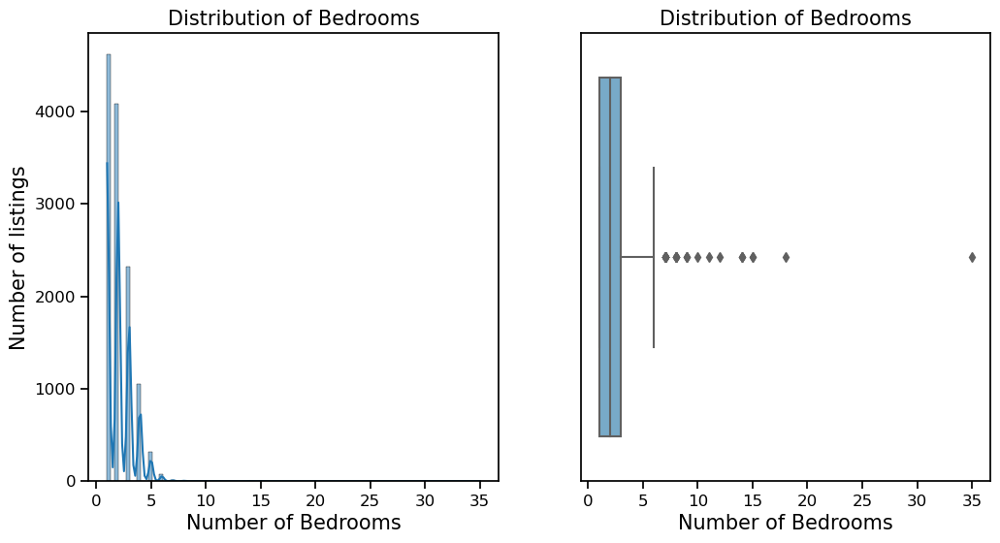

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["bedrooms"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Number of Bedrooms")
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of Bedrooms")

# Create a boxplot
sns.boxplot(data = train["bedrooms"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel("Number of Bedrooms")
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of Bedrooms")

plt.show()

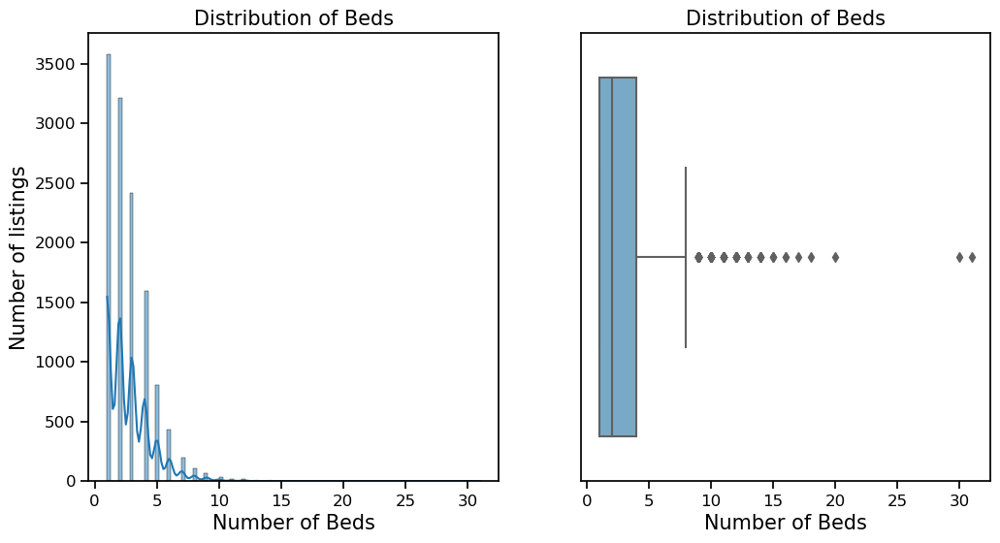

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["beds"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Number of Beds")
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of Beds")

# Create a boxplot
sns.boxplot(data = train["beds"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel("Number of Beds")
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of Beds")

plt.show()

### 2.4 Locations
**Geoplot**

In [19]:
# Find the center point of the map by the mean latitude and longitude
map_center = [train['latitude'].mean(), train['longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=6)

# Define each node colour based on price
color_ranges = {
    'red': (1000, float('inf')),
    'orange': (600, 1000),
    'purple': (200, 600),
    'blue': (0, 200),
}

# Create price range legend
price_range_legend = """
<div style="position: fixed;
     bottom: 50px; left: 50px; width: 150px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color: white;
     opacity: 0.8;">
     <p><strong>Price Range</strong></p>
     <p><i class="circle" style="background: red;"></i> $1000 and above</p>
     <p><i class="circle" style="background: orange;"></i> $600 - $999</p>
     <p><i class="circle" style="background: purple;"></i> $200 - $599</p>
     <p><i class="circle" style="background: blue;"></i> Less than $200</p>
</div>
<style>
    .circle {
        width: 15px;
        height: 15px;
        display: inline-block;
    }
</style>
"""
map.get_root().html.add_child(folium.Element(price_range_legend))

# Iterate through the data and add node to the map
for _, row in train.iterrows():
    # Calculate the node size based on the price
    circle_size = row['price'] / 100

    # Determine the circle color based on the price using the colormap
    for color, (min_price, max_price) in color_ranges.items():
        if min_price <= row['price'] < max_price:
            circle_color = color
            break

    # Define the details of node
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=circle_size,
        color=circle_color,
        fill=True,
        fill_color=circle_color,
        fill_opacity=0.6,
        tooltip=f"Price: ${row['price']}",
    ).add_to(map)

map


**Neighbourhood**

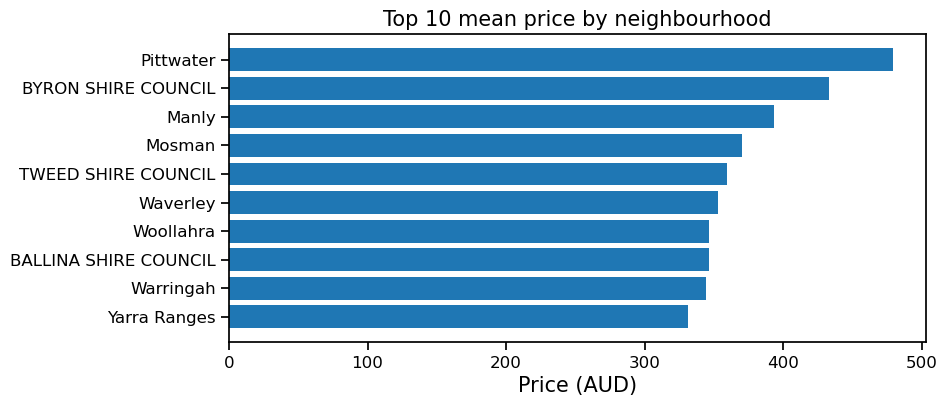

In [20]:
# Calculate the mean house price by neighbourhood
neighborhood_mean_prices = train.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)

# Plot the top 10 neighbourhood that have the highest mean house price
plt.figure(figsize=(9, 4))
plt.barh(neighborhood_mean_prices.head(10)[::-1].index, neighborhood_mean_prices.head(10)[::-1])
plt.title('Top 10 mean price by neighbourhood')
plt.xlabel('Price (AUD)')
plt.show()

### 2.5 Length of stay

In [21]:
# Descriptive statistics for the min and max nights
min_nights_stats = train["minimum_nights"].describe()
max_nights_stats = train["maximum_nights"].describe()

# Store those stats as dataframe
min_max_nights_stats_df = pd.DataFrame({
    "Minimum Nights": min_nights_stats,
    "Maximum Nights": max_nights_stats
})

min_max_nights_stats_df

,Minimum Nights,Maximum Nights
count,12500.000000,12500.00000
mean,6.366320,575.79008
std,23.493225,484.72756
min,1.000000,1.00000
25%,2.000000,70.00000
50%,2.000000,365.00000
75%,3.000000,1125.00000
max,999.000000,1162.00000


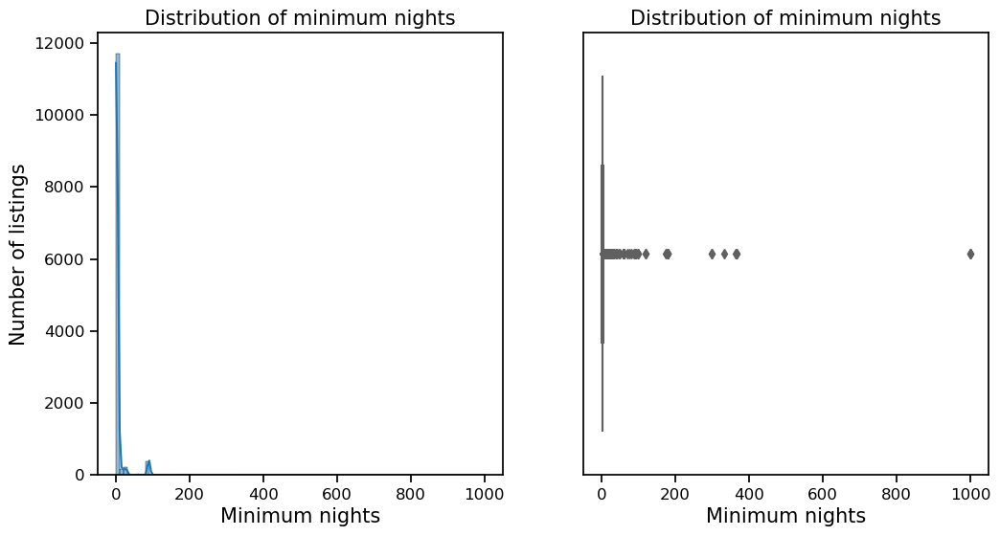

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["minimum_nights"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Minimum nights")
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of minimum nights")

# Create a boxplot
sns.boxplot(data = train["minimum_nights"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel("Minimum nights")
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of minimum nights")

plt.show()

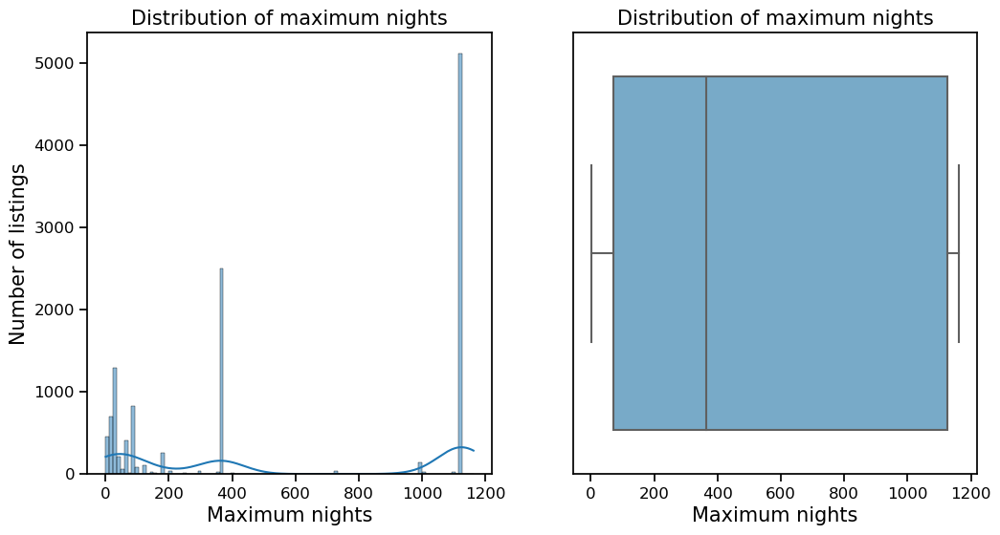

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["maximum_nights"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel("Maximum nights")
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of maximum nights")

# Create a boxplot
sns.boxplot(data = train["maximum_nights"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel("Maximum nights")
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of maximum nights")

plt.show()

### 2.6 Correlation matrix (numeric features & price)

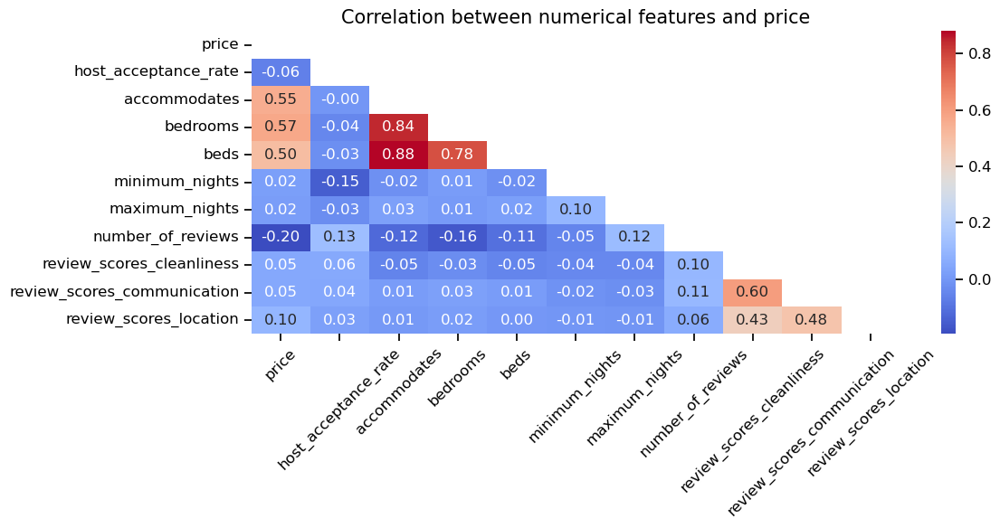

In [24]:
numerical_features = train.select_dtypes(include=['int64', 'float64'])
corr_features = numerical_features.drop(columns=['id', 'latitude', 'longitude'])

corr = corr_features.corr()
matrix = np.triu(corr)

plt.figure(figsize=(12, 6))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", mask=matrix)
plt.title("Correlation between numerical features and price")
plt.xticks(rotation = 45)
plt.tight_layout()
# plt.show()
plt.savefig('1.png')

### 2.7 Booking history
**Review Scores**

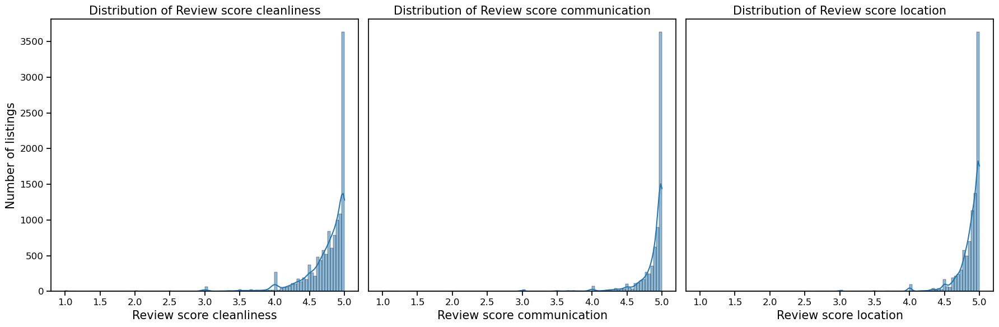

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# review_scores_cleanliness
sns.histplot(data=train["review_scores_cleanliness"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel('Review score cleanliness')
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Distribution of Review score cleanliness")

# review_scores_communication
sns.histplot(data=train["review_scores_communication"], kde=True, bins=100, ax=axes[1])
axes[1].set_xlabel('Review score communication')
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Distribution of Review score communication")

# review_scores_location
sns.histplot(data=train["review_scores_location"], kde=True, bins=100, ax=axes[2])
axes[2].set_xlabel('Review score location')
axes[2].get_yaxis().set_visible(False)
axes[2].set_title("Distribution of Review score location")

plt.tight_layout()
plt.show()

**Acceptance Rate**

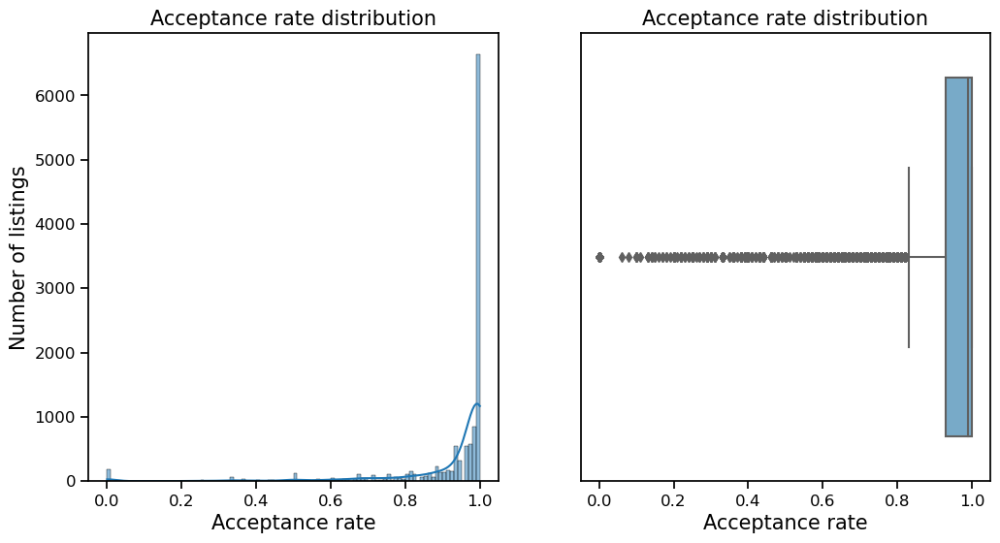

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train["host_acceptance_rate"], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel('Acceptance rate')
axes[0].set_ylabel("Number of listings")
axes[0].set_title("Acceptance rate distribution")

# Create a boxplot
sns.boxplot(data = train["host_acceptance_rate"], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel('Acceptance rate')
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("Acceptance rate distribution")

plt.show()

**Number of Review**

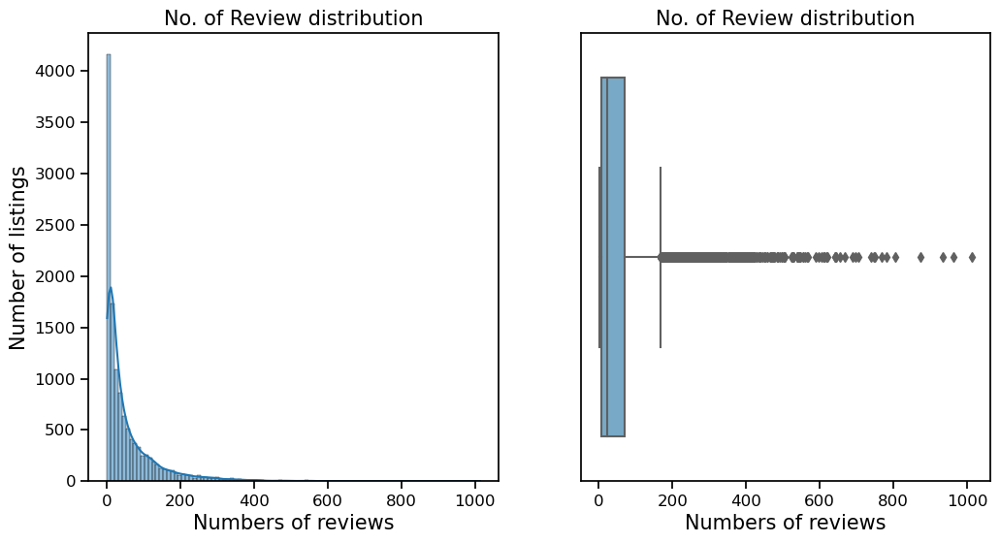

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Create a histogram
sns.histplot(data=train['number_of_reviews'], kde=True, bins=100, ax=axes[0])
axes[0].set_xlabel('Numbers of reviews')
axes[0].set_ylabel("Number of listings")
axes[0].set_title("No. of Review distribution")

# Create a boxplot
sns.boxplot(data = train['number_of_reviews'], palette="Blues", orient="h", ax=axes[1])
axes[1].set_xlabel('Numbers of reviews')
axes[1].get_yaxis().set_visible(False)
axes[1].set_title("No. of Review distribution")

plt.show()

### 2.8 Amenities 

In [28]:
# Find unique values in 'standardized_amenities'
unique_amenities = train['standardized_amenities'].explode().unique()

# Calculate the average price with all amenities
average_price_with_amenities = train['price'].mean()

# Create an empty list to store results
amenity_price_differences = []

# Calculate price difference for each amenity
for amenity in unique_amenities:
    # Calculate the average price without the current amenity
    average_price_without_amenity = train[train['standardized_amenities'].apply(lambda x: amenity not in x)]['price'].mean()

    # Calculate the price difference
    price_difference = average_price_with_amenities - average_price_without_amenity

    # Append the result to the list
    amenity_price_differences.append({'Amenity': amenity, 'Price_Difference': price_difference})

# Convert the list to a DataFrame
amenity_price_differences = pd.DataFrame(amenity_price_differences)

# Sort by price difference in amenity
amenity_price_differences = amenity_price_differences.sort_values(by='Price_Difference', ascending=False)

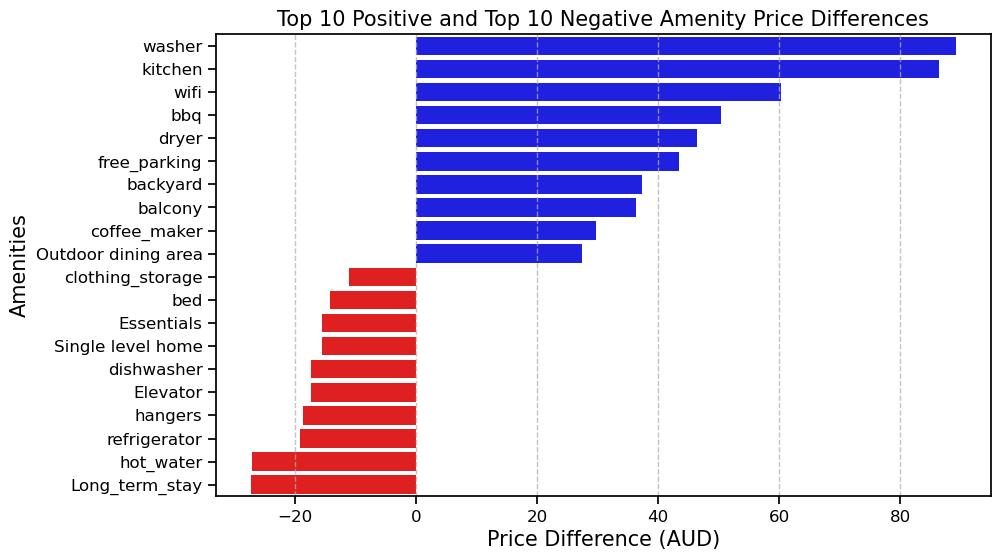

In [29]:
# Extract the top 10 most positive and top 10 most negative differences
top_positive = amenity_price_differences.head(10)
top_negative = amenity_price_differences.tail(10)

# Combine them into a single DataFrame for plotting
combined = pd.concat([top_positive, top_negative])

# Bar chart
plt.figure(figsize=(10, 6))
sns.barplot(data=combined, x='Price_Difference', y='Amenity', palette=['b' if diff > 0 else 'r' for diff in combined['Price_Difference']])
plt.xlabel('Price Difference (AUD)')
plt.ylabel('Amenities')
plt.title('Top 10 Positive and Top 10 Negative Amenity Price Differences')
plt.grid(axis='x', linestyle='--', alpha=0.75)
plt.show()


### 2.9 Word count for text data

In [ ]:
# Compute the word count for each listing
amenities_count = pd.DataFrame(train['amenities'].str.split(',').str.len())
description_word_count = pd.DataFrame(train['description'].str.split().str.len())
neighborhood_overview_word_count = pd.DataFrame(train['neighborhood_overview'].str.split().str.len())

# Set the column names separately
amenities_count.columns = ['amenities_word_count']
description_word_count.columns = ['description_word_count']
neighborhood_overview_word_count.columns = ['neighborhood_overview_word_count']

word_count_df = pd.concat([amenities_count, description_word_count, neighborhood_overview_word_count, y_train_complete], axis=1)

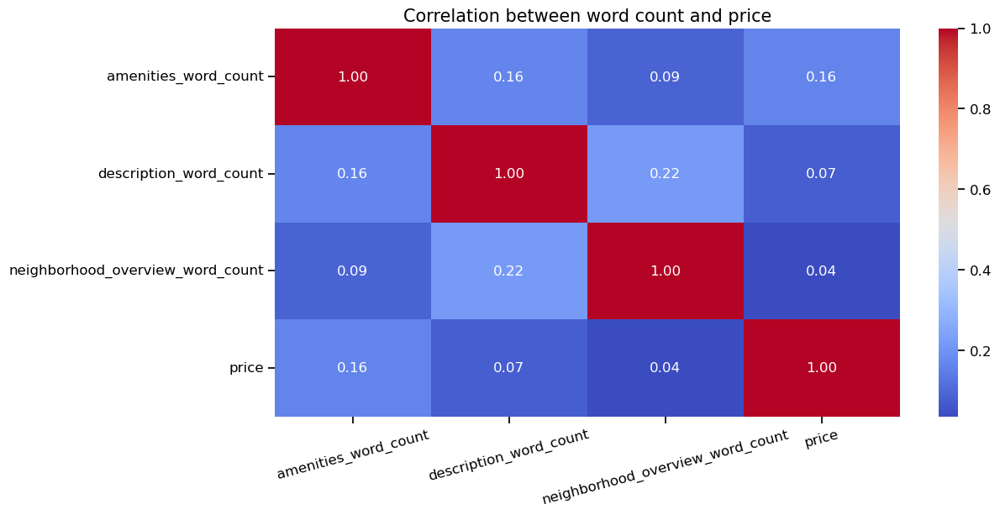

In [ ]:
plt.figure(figsize=(12, 6))
sns.heatmap(word_count_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation between word count and price")
plt.xticks(rotation=15)
plt.show()

### 2.10 Sentiment analysis of description column

In [31]:
analyzer = SentimentIntensityAnalyzer()

# Sentiment analysis to the train dataset
train_Sentiment_Scores = train["description"].apply(lambda x: analyzer.polarity_scores(x))
# Set positive if polarity score >= 0.25, negative if <= -0.25
train_Sentiment_Category = train_Sentiment_Scores.apply(lambda x: "Positive" if x["compound"] >= 0.25 else "Negative" if x["compound"] <= -0.25 else "Neutral")

# Convert to DataFrame
sentiment_category_df = pd.DataFrame(train_Sentiment_Category)
# Rename the column to sentiment_category
sentiment_category_df.columns = ['sentiment_category']

sentiment_df = pd.concat([sentiment_category_df, y_train_complete], axis = 1)

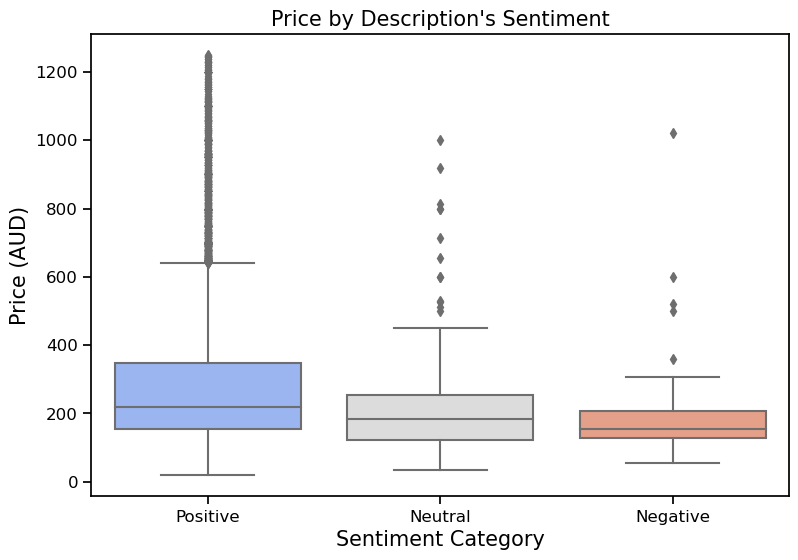

In [32]:
# Create a boxplot for each sentiment category
plt.figure(figsize=(9, 6))
sns.boxplot(data = sentiment_df, x = "sentiment_category", y = "price", palette='coolwarm')

# Add labels and title
plt.xlabel("Sentiment Category")
plt.ylabel("Price (AUD)")
plt.title("Price by Description's Sentiment")

# Show the plot
plt.show()

## <font color = '#e64626'><a id='feature_engineering'>3. Feature Engineering</a></font>

In [ ]:
def haversine_distance(coord1, coord2):
    """ This function is used to compute the distance between each listing and major cities (Sydney / Melbourne)"""
    # Radius of the Earth in kilometers
    R = 6371.0

    # Coordinates
    lat1 = math.radians(coord1[0])
    lon1 = math.radians(coord1[1])
    lat2 = math.radians(coord2[0])
    lon2 = math.radians(coord2[1])

    # Compute the latitude and longitude difference between two locations
    long_diff = lon2 - lon1
    lat_diff = lat2 - lat1

    # Haversine formula
    a = math.sin(lat_diff / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(long_diff / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    distance = R * c

    return distance

In [ ]:
def feature_engineering(train, test):

    ################################# Create new features based on word count #################################
    train['amenities_count'] = train['amenities'].str.split(',').str.len()
    test['amenities_count'] = test['amenities'].str.split(',').str.len()

    train['description_word_count'] = train['description'].str.split().str.len()
    train['neighborhood_overview_word_count'] = train['neighborhood_overview'].str.split().str.len()

    test['description_word_count'] = test['description'].str.split().str.len()
    test['neighborhood_overview_word_count'] = test['neighborhood_overview'].str.split().str.len()



    ######################### Calculate distance to Sydney and Melbourne using haversine distance formula #########################
    sydney_coords = (-33.8688, 151.2093) # from google
    melbourne_coords = (-37.8136, 144.9631)

    train['distance_to_sydney'] = train.apply(lambda row: haversine_distance((row['latitude'], row['longitude']), sydney_coords), axis=1)
    train['distance_to_melbourne'] = train.apply(lambda row: haversine_distance((row['latitude'], row['longitude']), melbourne_coords), axis=1)

    test['distance_to_sydney'] = test.apply(lambda row: haversine_distance((row['latitude'], row['longitude']), sydney_coords), axis=1)
    test['distance_to_melbourne'] = test.apply(lambda row: haversine_distance((row['latitude'], row['longitude']), melbourne_coords), axis=1)



    ################################# Sentiment analysis of description column #################################
    analyzer = SentimentIntensityAnalyzer()

    # Sentiment analysis to the train dataset
    train["Sentiment_Scores"] = train["description"].apply(lambda x: analyzer.polarity_scores(x))
    train["Sentiment_Category"] = train["Sentiment_Scores"].apply(lambda x: "Positive" if x["compound"] >= 0.25 else "Negative" if x["compound"] <= -0.25 else "Neutral")

    # Sentiment analysis to the test dataset
    test["Sentiment_Scores"] = test["description"].apply(lambda x: analyzer.polarity_scores(x))
    test["Sentiment_Category"] = test["Sentiment_Scores"].apply(lambda x: "Positive" if x["compound"] >= 0.25 else "Negative" if x["compound"] <= -0.25 else "Neutral")



    ################################# Identify "beach" and "city / CBD" keyowrds in description #################################
    des_keywords = ["beach", "city"]

    train_des_location_df = pd.DataFrame({f"des_{keyword}": train['description'].str.contains(keyword, case=False).astype(int) for keyword in des_keywords})
    test_des_location_df = pd.DataFrame({f"des_{keyword}": test['description'].str.contains(keyword, case=False).astype(int) for keyword in des_keywords})

    train_des_location_df["des_city"] = (train['description'].str.contains('city|CBD', case=False)).astype(int)
    test_des_location_df["des_city"] = (test['description'].str.contains('city|CBD', case=False)).astype(int)



    ################################# TF-IDF vectorizer for standardized_amenities column #################################
    tfidf_vectorizer = TfidfVectorizer()

    train_tfidf_matrix = tfidf_vectorizer.fit_transform(train['standardized_amenities'].str.join(' '))
    test_tfidf_matrix = tfidf_vectorizer.transform(test['standardized_amenities'].str.join(' '))

    # Convert the TF-IDF matrix to a DataFrame
    train_amenities_df = pd.DataFrame(train_tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
    test_amenities_df = pd.DataFrame(test_tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())



    ###################################### Drop unnecessary columns ######################################
    train = train.drop(columns=['id', 'price', 'description', 'neighborhood_overview', 'amenities','standardized_amenities', "Sentiment_Scores", "property_type"])
    test = test.drop(columns=['id', 'description', 'neighborhood_overview', 'amenities', 'standardized_amenities', "Sentiment_Scores", "property_type"])


    ################################# Separate numerical and categorical features for processing #################################
    numeric_features = train.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_features = train.select_dtypes(exclude=['int64', 'float64']).columns.tolist()

    # Perform imputation (median) and standardization for numerical features
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())])

    # Perform imputation (mode) and one hot encoding for categorical features
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore'))])

    # Using ColumnTransformer to combine the above transformers
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)])

    # Applying the transformations
    transformed_train = preprocessor.fit_transform(train)
    transformed_test = preprocessor.transform(test)

    # Transform to DataFrame
    transformed_train_df = pd.DataFrame(transformed_train, columns = preprocessor.get_feature_names_out())
    transformed_test_df = pd.DataFrame(transformed_test, columns = preprocessor.get_feature_names_out())


    ################################# Concatenate Processed features into one DataFrame #################################
    X_train_complete = pd.concat([transformed_train_df, train_amenities_df, train_des_location_df], axis=1)
    X_test_complete = pd.concat([transformed_test_df, test_amenities_df, test_des_location_df], axis=1)



    return X_train_complete, X_test_complete


In [ ]:
# Perform feature engineering
X_train_complete, X_test_complete = feature_engineering(train, test)

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


## <font color = '#e64626'><a id='methodology'>4. Methodology</a></font>

In [ ]:
# Split train data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_complete, y_train_complete, test_size=0.2, random_state=42)

print("train shape", X_train.shape, y_train.shape)
print("val shape", X_val.shape, y_val.shape)

train shape (10000, 237) (10000,)
val shape (2500, 237) (2500,)


### <font color = '#e64626'><a id='model_1'>4.1. Model 1: Lasso</a></font>

**Kaggle test set score: 140.9225**


#### Perform 5-fold Corss valdiation for hyperparameter tuning for Lasso model

In [ ]:
# Hyperparameter tuning for Lasso using Grid Search CV
def lasso_GridSearchCV(X_train, y_train):

    # Set up parameters grid to search
    param_grid = {"alpha": [0.001, 0.005, 0.01, 0.03, 0.05, 0.1, 0.2]
                  }

    # Instantiate lasso model
    lasso = Lasso(random_state = 0)
    grid_search = GridSearchCV(lasso, param_grid, scoring='neg_root_mean_squared_error', cv=5, verbose=3)

    # Record the starting time
    start_time = time.time()

    # Fit the training data
    grid_search.fit(X_train, y_train)

    # Calculate the training time
    time_elapsed = time.time() - start_time

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print("Best parameters found: ", best_params)
    print("Best accuracy found: ", best_score)
    print("Time elapsed: {:.2f} seconds".format(time_elapsed))

    return best_params

In [ ]:
# Perform Grid Search CV for Lasso
lasso_best_params = lasso_GridSearchCV(X_train, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.918e+07, tolerance: 3.355e+04
  model = cd_fast.enet_coordinate_descent(


[CV 1/5] END ....................alpha=0.001;, score=-143.530 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.943e+07, tolerance: 3.197e+04
  model = cd_fast.enet_coordinate_descent(


[CV 2/5] END ....................alpha=0.001;, score=-141.505 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.137e+07, tolerance: 3.286e+04
  model = cd_fast.enet_coordinate_descent(


[CV 3/5] END ....................alpha=0.001;, score=-135.000 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.182e+07, tolerance: 3.376e+04
  model = cd_fast.enet_coordinate_descent(


[CV 4/5] END ....................alpha=0.001;, score=-131.146 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.008e+07, tolerance: 3.281e+04
  model = cd_fast.enet_coordinate_descent(


[CV 5/5] END ....................alpha=0.001;, score=-139.037 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.021e+07, tolerance: 3.355e+04
  model = cd_fast.enet_coordinate_descent(


[CV 1/5] END ....................alpha=0.005;, score=-143.577 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.111e+07, tolerance: 3.197e+04
  model = cd_fast.enet_coordinate_descent(


[CV 2/5] END ....................alpha=0.005;, score=-141.455 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.484e+07, tolerance: 3.286e+04
  model = cd_fast.enet_coordinate_descent(


[CV 3/5] END ....................alpha=0.005;, score=-134.965 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.211e+07, tolerance: 3.376e+04
  model = cd_fast.enet_coordinate_descent(


[CV 4/5] END ....................alpha=0.005;, score=-131.169 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.194e+07, tolerance: 3.281e+04
  model = cd_fast.enet_coordinate_descent(


[CV 5/5] END ....................alpha=0.005;, score=-138.953 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.556e+07, tolerance: 3.355e+04
  model = cd_fast.enet_coordinate_descent(


[CV 1/5] END .....................alpha=0.01;, score=-143.613 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.603e+07, tolerance: 3.197e+04
  model = cd_fast.enet_coordinate_descent(


[CV 2/5] END .....................alpha=0.01;, score=-141.439 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.383e+07, tolerance: 3.286e+04
  model = cd_fast.enet_coordinate_descent(


[CV 3/5] END .....................alpha=0.01;, score=-134.900 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.779e+07, tolerance: 3.376e+04
  model = cd_fast.enet_coordinate_descent(


[CV 4/5] END .....................alpha=0.01;, score=-131.117 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.846e+07, tolerance: 3.281e+04
  model = cd_fast.enet_coordinate_descent(


[CV 5/5] END .....................alpha=0.01;, score=-138.902 total time=   2.3s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.934e+06, tolerance: 3.355e+04
  model = cd_fast.enet_coordinate_descent(


[CV 1/5] END .....................alpha=0.03;, score=-143.742 total time=   2.8s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.353e+07, tolerance: 3.197e+04
  model = cd_fast.enet_coordinate_descent(


[CV 2/5] END .....................alpha=0.03;, score=-141.481 total time=   2.1s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.762e+06, tolerance: 3.286e+04
  model = cd_fast.enet_coordinate_descent(


[CV 3/5] END .....................alpha=0.03;, score=-134.814 total time=   2.2s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.288e+07, tolerance: 3.376e+04
  model = cd_fast.enet_coordinate_descent(


[CV 4/5] END .....................alpha=0.03;, score=-131.039 total time=   2.1s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.196e+07, tolerance: 3.281e+04
  model = cd_fast.enet_coordinate_descent(


[CV 5/5] END .....................alpha=0.03;, score=-138.824 total time=   2.1s
[CV 1/5] END .....................alpha=0.05;, score=-143.749 total time=   2.0s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.805e+06, tolerance: 3.197e+04
  model = cd_fast.enet_coordinate_descent(


[CV 2/5] END .....................alpha=0.05;, score=-141.700 total time=   2.1s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.416e+06, tolerance: 3.286e+04
  model = cd_fast.enet_coordinate_descent(


[CV 3/5] END .....................alpha=0.05;, score=-134.851 total time=   3.0s
[CV 4/5] END .....................alpha=0.05;, score=-131.074 total time=   1.5s


/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.599e+06, tolerance: 3.281e+04
  model = cd_fast.enet_coordinate_descent(


[CV 5/5] END .....................alpha=0.05;, score=-138.867 total time=   2.0s
[CV 1/5] END ......................alpha=0.1;, score=-144.053 total time=   0.7s
[CV 2/5] END ......................alpha=0.1;, score=-142.477 total time=   0.6s
[CV 3/5] END ......................alpha=0.1;, score=-135.325 total time=   0.7s
[CV 4/5] END ......................alpha=0.1;, score=-131.407 total time=   0.7s
[CV 5/5] END ......................alpha=0.1;, score=-139.350 total time=   0.8s
[CV 1/5] END ......................alpha=0.2;, score=-145.017 total time=   0.6s
[CV 2/5] END ......................alpha=0.2;, score=-144.136 total time=   0.4s
[CV 3/5] END ......................alpha=0.2;, score=-136.266 total time=   0.3s
[CV 4/5] END ......................alpha=0.2;, score=-132.178 total time=   0.3s
[CV 5/5] END ......................alpha=0.2;, score=-140.449 total time=   0.2s
Best parameters found:  {'alpha': 0.03}
Best accuracy found:  -137.97996372759434
Time elapsed: 64.11 seconds

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.381e+07, tolerance: 4.124e+04
  model = cd_fast.enet_coordinate_descent(


In [ ]:
# Initiate the lasso model with the best hyperparameter
lasso_model = Lasso(random_state=0, alpha=0.03)

# Fit the lasso with the training set
lasso_model.fit(X_train, y_train)

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.381e+07, tolerance: 4.124e+04
  model = cd_fast.enet_coordinate_descent(


Lasso(alpha=0.03, random_state=0)

#### Examine the lasso performance on validation set

In [ ]:
# Make prediction on validation set
lasso_val_pred = lasso_model.predict(X_val)

# Compute the lasso model RMSE on validation set
lasso_val_rmse = mean_squared_error(y_pred=lasso_val_pred, y_true=y_val, squared= False)
print(f"Lasso model RMSE on validation set: {lasso_val_rmse}")

Lasso model RMSE on validation set: 129.9981114397682


#### Lasso training RMSE

In [ ]:
# Make prediction on entire training set
lasso_train_pred = lasso_model.predict(X_train_complete)

# Compute the lasso model RMSE on training set
lasso_train_rmse = mean_squared_error(y_pred=lasso_train_pred, y_true=y_train_complete, squared= False)
print(f"Lasso model training RMSE: {lasso_train_rmse}")

Lasso model training RMSE: 133.73405977048984


#### Make prediction on test set for submission

In [ ]:
# Fit the lasso model with the complete training set
lasso_model.fit(X_train_complete,y_train_complete)

# Make prediction on Test set
lasso_test_pred = lasso_model.predict(X_test_complete)

# Create the submission csv file
id_col = np.arange(2500).reshape(-1, 1)
lasso_test_pred= lasso_test_pred.reshape(-1, 1)

lasso_data = np.hstack((id_col, lasso_test_pred))

lasso__submission = pd.DataFrame(lasso_data, columns=['id', 'price'])
lasso__submission['id'] = lasso__submission['id'].astype('int')

lasso__submission.to_csv('lasso_submission.csv', index=False)

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.104e+07, tolerance: 5.064e+04
  model = cd_fast.enet_coordinate_descent(


#### Lasso model interpretation

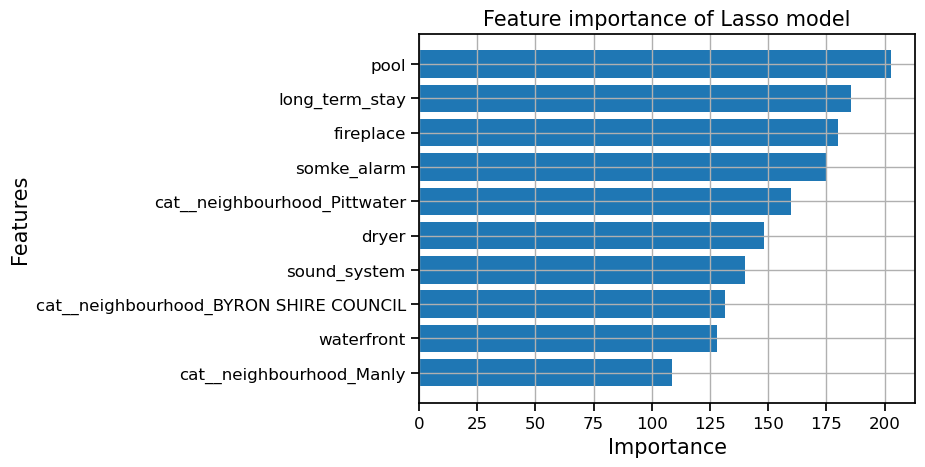

In [ ]:
# Get lasso coefficient
top_lasso_coef = np.abs(lasso_model.coef_)

# top 10 coefficients with the largest absolute values
top_lasso_coef_indices = np.argsort(top_lasso_coef)[-10:]

# Select the top 10 feature names
top_10_feature_names = X_train.columns[top_lasso_coef_indices]

# Select the corresponding coefficients
top_10_coeffs = top_lasso_coef[top_lasso_coef_indices]


plt.barh(top_10_feature_names, top_10_coeffs)
plt.grid()
plt.title("Feature importance of Lasso model")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()

### <font color = '#e64626'><a id='model_2'>4.2. Model 2: Decision Tree</a></font>

**Kaggle test set score: 182.64807**

 #### Perform 5-fold Corss valdiation for hyperparameter tuning

In [ ]:
# Hyperparameter tuning for Decision tree using Grid Search CV
def DT_GridSearchCV(X_train, y_train):

    # Set up parameters grid to search
    param_grid = {"max_features": ["log2", "sqrt"],
                  "max_depth": [5, 10, 25, 30],
                  "min_samples_split": [2, 5, 10]
                  }

    # Instantiate Decision tree
    dt = DecisionTreeRegressor(random_state = 0, criterion = "squared_error")
    grid_search = GridSearchCV(dt, param_grid, scoring='neg_root_mean_squared_error', cv=5, verbose=3)

    # Record the starting time
    start_time = time.time()

    # Fit the training data
    grid_search.fit(X_train, y_train)

    # Calculate the training time
    time_elapsed = time.time() - start_time

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print("Best parameters found: ", best_params)
    print("Best accuracy found: ", best_score)
    print("Time elapsed: {:.2f} seconds".format(time_elapsed))

    return best_params

In [ ]:
# Perform Grid Search CV for Lasso
dt_best_params = DT_GridSearchCV(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END max_depth=5, max_features=log2, min_samples_split=2;, score=-159.432 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, min_samples_split=2;, score=-189.950 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, min_samples_split=2;, score=-180.726 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, min_samples_split=2;, score=-159.909 total time=   0.0s
[CV 5/5] END max_depth=5, max_features=log2, min_samples_split=2;, score=-178.494 total time=   0.0s
[CV 1/5] END max_depth=5, max_features=log2, min_samples_split=5;, score=-159.432 total time=   0.0s
[CV 2/5] END max_depth=5, max_features=log2, min_samples_split=5;, score=-189.950 total time=   0.0s
[CV 3/5] END max_depth=5, max_features=log2, min_samples_split=5;, score=-180.726 total time=   0.0s
[CV 4/5] END max_depth=5, max_features=log2, min_samples_split=5;, score=-159.909 total time=   0.0s
[CV 5/5] END max_depth=5, max

In [ ]:
# Initiate the decisioin tree model with the best hyperparameter
dt_model = DecisionTreeRegressor(max_depth = 5,
                                    max_features="log2",
                                    min_samples_leaf=2,
                                    random_state=0)

# Fit the decision tree with the training set
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, max_features='log2', min_samples_leaf=2,
                      random_state=0)

#### Examine the decision tree model performance on validation set

In [ ]:
# Make prediction on validation set
dt_val_pred = dt_model.predict(X_val)

# Compute the lasso model RMSE on validation set
dt_val_rmse = mean_squared_error(y_pred=dt_val_pred, y_true=y_val, squared= False)
print(f"Decision Tree model RMSE on validation set: {dt_val_rmse}")

Decision Tree model RMSE on validation set: 168.41673109203887


#### Decision Tree Training RMSE

In [ ]:
# Make prediction on validation set
dt_train_pred = dt_model.predict(X_train_complete)

# Compute the lasso model RMSE on validation set
dt_train_rmse = mean_squared_error(y_pred=dt_train_pred, y_true=y_train_complete, squared= False)
print(f"Decision tree training RMSE: {dt_train_rmse}")

Decision tree training RMSE: 169.37012955535198


#### Make prediction on test set for submission

In [ ]:
# Fit the decision tree model with the complete training set
dt_model.fit(X_train_complete,y_train_complete)

# Make prediction on Test set
dt_test_pred = dt_model.predict(X_test_complete)

# Create the submission csv file
id_col = np.arange(2500).reshape(-1, 1)
dt_test_pred= dt_test_pred.reshape(-1, 1)

dt_data = np.hstack((id_col, dt_test_pred))

dt_submission = pd.DataFrame(dt_data, columns=['id', 'price'])
dt_submission['id'] = dt_submission['id'].astype('int')

dt_submission.to_csv('dt_submission.csv', index=False)

#### Decision tree model interpretation

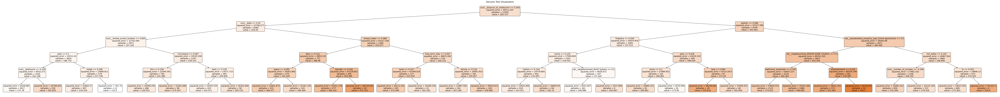

In [ ]:
# Plot the entire deicison tree
plt.figure(figsize=(128, 12))
plot_tree(dt_model, filled=True, rounded=True, feature_names=X_train.columns.tolist(), fontsize=14)
plt.title("Decision Tree Visualization")
plt.savefig("full_decision_tree_plot.png")
plt.show()

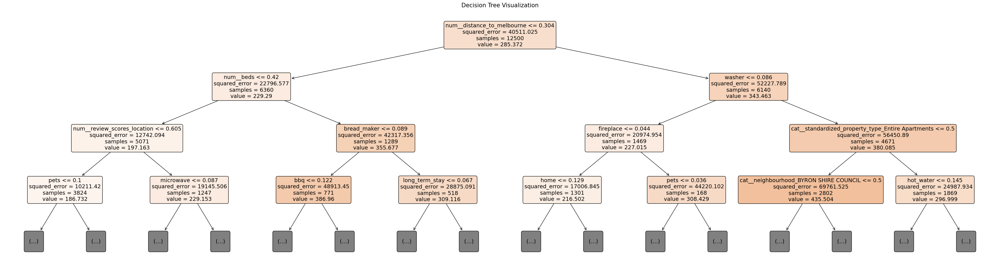

In [ ]:
# Plot the deicison tree (only the top 3 levels)
plt.figure(figsize=(46, 12))
plot_tree(dt_model, filled=True, rounded=True, feature_names=X_train.columns.tolist(), fontsize=14, max_depth=3)
plt.title("Decision Tree Visualization")
plt.savefig("top3_decision_tree_plot.png")
plt.show()

### <font color = '#e64626'><a id='model_3'>4.2. Model 3: Stacking model</a></font>

The stacking model consists of four base models and one meta model(linear regression)

Four base models are Lasso, random forest, gradient boost and XG boost

**Kaggle test set score: 124.0211**

### Base model: Random forest

#### Perform cross validation for random forest

In [ ]:
# Hyperparameter tuning for Random Forest using Grid Search CV
def RF_GridSearchCV(X_train, y_train):

    # Set up parameters grid to search
    param_grid = {"n_estimators": [600, 800, 1000],
                  "max_features": ["log2", "sqrt"],
                  "max_depth": [10, 25, 30]
                  }

    # Instantiate Random Forest model
    rf = RandomForestRegressor(random_state = 0, criterion = "squared_error")
    grid_search = GridSearchCV(rf, param_grid, scoring='neg_root_mean_squared_error', cv=5, verbose=3)

    # Record the starting time
    start_time = time.time()

    # Fit the training data
    grid_search.fit(X_train, y_train)

    # Calculate the training time
    time_elapsed = time.time() - start_time

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print("Best parameters found: ", best_params)
    print("Best accuracy found: ", best_score)
    print("Time elapsed: {:.2f} seconds".format(time_elapsed))

    return best_params

In [ ]:
# Perform Grid Search CV for Random Forest
rf_best_params = RF_GridSearchCV(X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END max_depth=10, max_features=log2, n_estimators=600;, score=-146.670 total time=   6.3s
[CV 2/5] END max_depth=10, max_features=log2, n_estimators=600;, score=-156.524 total time=   6.3s
[CV 3/5] END max_depth=10, max_features=log2, n_estimators=600;, score=-148.689 total time=   6.2s
[CV 4/5] END max_depth=10, max_features=log2, n_estimators=600;, score=-138.316 total time=   6.3s
[CV 5/5] END max_depth=10, max_features=log2, n_estimators=600;, score=-151.178 total time=   6.3s
[CV 1/5] END max_depth=10, max_features=log2, n_estimators=800;, score=-146.489 total time=   8.5s
[CV 2/5] END max_depth=10, max_features=log2, n_estimators=800;, score=-156.179 total time=   8.6s
[CV 3/5] END max_depth=10, max_features=log2, n_estimators=800;, score=-148.437 total time=   8.5s
[CV 4/5] END max_depth=10, max_features=log2, n_estimators=800;, score=-138.345 total time=   8.5s
[CV 5/5] END max_depth=10, max_features=log2, n_

In [ ]:
# Build Random Forest classifier with best hyperparameters
rf_model = RandomForestRegressor(n_estimators = 1000,
                        max_features = "sqrt",
                        max_depth = 30,
                        random_state = 0,
                        criterion = "squared_error")

# Fit the Random Forest classifier with training data
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=30, max_features='sqrt', n_estimators=1000,
                      random_state=0)

#### Evaluate the randoom forest model performance on validation set

In [ ]:
# Examine the decision tree model performance on validation set
rf_val_pred = rf_model.predict(X_val)

rf_val_rmse = mean_squared_error(y_pred=rf_val_pred, y_true=y_val, squared= False)
print(f"Random forest model RMSE on validation set: {rf_val_rmse}")

Random forest model RMSE on validation set: 127.34954347914542


#### Random forest model interpretation

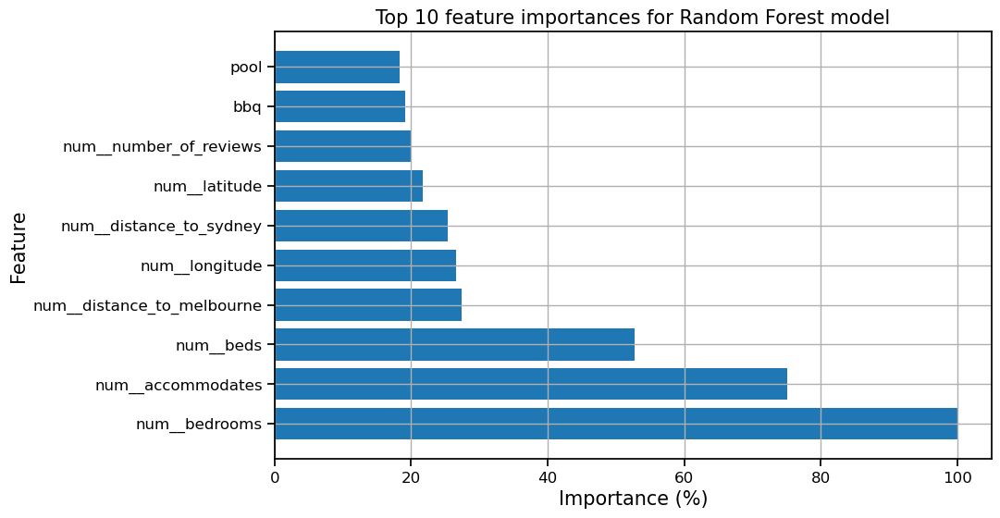

In [ ]:
# Get feature importances from the Random Forest model
rf_feature_importances = pd.Series(100*(rf_model.feature_importances_/np.max(rf_model.feature_importances_)))

# Get the feature names
feature_names = X_train.columns.tolist()

# Create DataFrame to store feature names and importance
rf_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': rf_feature_importances})

# Sort the features by importance in descending order
rf_feature_importance_df = rf_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top 10 most important feature
plt.figure(figsize=(10, 6))
plt.barh(rf_feature_importance_df['Feature'][:10], rf_feature_importance_df['Importance'][:10])
plt.xlabel('Importance (%)')
plt.ylabel('Feature')
plt.title('Top 10 feature importances for Random Forest model')
plt.grid()
plt.show()

### Base model: Gradient boost

#### Perform cross validation for Gradient boost

In [ ]:
# Hyperparameter tuning using Grid Search CV
def GB_GridSearchCV(X_train, y_train):

    # Set up parameters grid to search
    param_grid = {"learning_rate": [1e-2, 0.05, 0.1],
                  "l2_regularization": [0.0, 1e-2, 0.1],
                  "max_depth": [20, 30],
                  "max_iter": [500, 600]
                  }

    # Instantiate Gradient boosting model
    gb = HistGradientBoostingRegressor(random_state = 0, loss = "squared_error")
    grid_search = GridSearchCV(gb, param_grid, scoring='neg_root_mean_squared_error', cv=5, verbose=3)

    # Record the starting time
    start_time = time.time()

    # Fit the training data
    grid_search.fit(X_train, y_train)

    # Calculate the training time
    time_elapsed = time.time() - start_time

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print("Best parameters found: ", best_params)
    print("Best accuracy found: ", best_score)
    print("Time elapsed: {:.2f} seconds".format(time_elapsed))

    return best_params

In [ ]:
# Perform Grid Search CV for gradient boost
gb_best_params = GB_GridSearchCV(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=500;, score=-126.985 total time=  17.5s
[CV 2/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=500;, score=-125.798 total time=  18.1s
[CV 3/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=500;, score=-123.397 total time=  16.6s
[CV 4/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=500;, score=-115.044 total time=  17.3s
[CV 5/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=500;, score=-126.233 total time=  16.4s
[CV 1/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=600;, score=-126.123 total time=  19.6s
[CV 2/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=600;, score=-124.531 total time=  20.3s
[CV 3/5] END l2_regularization=0.0, learning_rate=0.01, max_depth=20, max_iter=600;, score=-122.513 total

In [ ]:
# Build Gradient boost with best hyperparameters
gb_model = HistGradientBoostingRegressor(learning_rate = 0.05,
                        l2_regularization = 0.1,
                        max_depth = 30,
                        max_iter = 500,
                        random_state = 0,
                        loss = "squared_error"
                        )

# Fit the gradient boost model with training data
gb_model.fit(X_train, y_train)

HistGradientBoostingRegressor(l2_regularization=0.1, learning_rate=0.05,
                              max_depth=30, max_iter=500, random_state=0)

#### Evaluate the gradient boost model performance on validation set

In [ ]:
# Make prediction on valdiation set
gb_pred = gb_model.predict(X_val)

# Compute rmse
gb_rmse = mean_squared_error(y_pred=gb_pred, y_true=y_val, squared= False)
print(f"Gradient boost model RMSE on validation set: {gb_rmse}")

Gradient boost model RMSE on validation set: 116.2930258499363


#### Gradient boost model interpretation

The Histgradient regressor does not support feature_importances_ command, therefore permutation importance is used to interpret the feature importance for gradient boost model

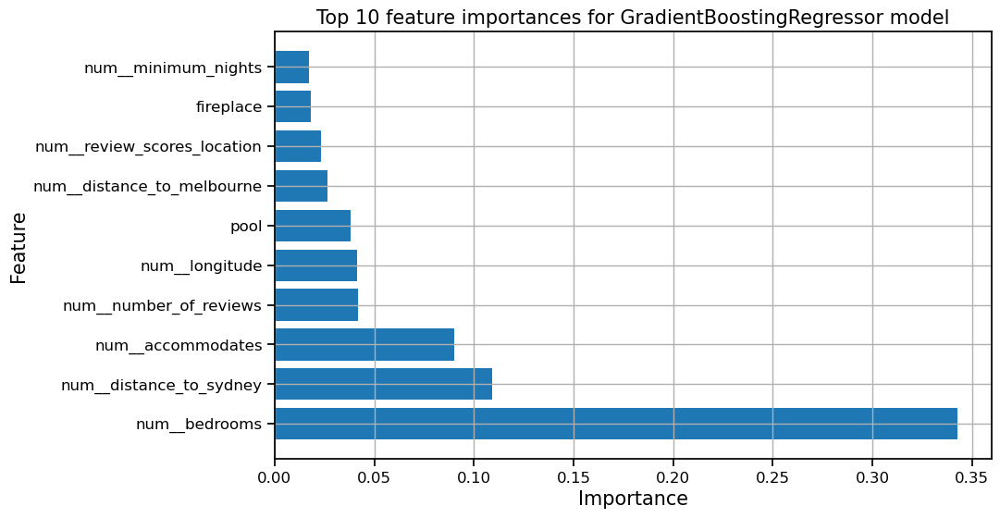

In [ ]:
# Calculate permutation feature importances
gb_feat_importance = permutation_importance(gb_model, X_train, y_train, n_repeats=30, random_state=0)

# Get the feature names
feature_names = X_train.columns.tolist()

# Create dataframe
gb_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': gb_feat_importance.importances_mean})

# Sort the features by importance in descending order
gb_feature_importance_df = gb_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top 10 most important features
plt.figure(figsize=(10, 6))
plt.barh(gb_feature_importance_df['Feature'][:10], gb_feature_importance_df['Importance'][:10])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 feature importances for GradientBoostingRegressor model')
plt.grid()
plt.show()

### Base model: XG Boost

#### Perform cross validation for XG Boost

In [ ]:
# Hyperparameter tuning using Grid Search CV
def XGB_GridSearchCV(X_train, y_train):

    # Set up parameters grid to search
    param_grid = {"eta": [0.05, 0.10],
                  "max_depth": [3, 5, 7],
                  "gamma":[0.0, 0.05, 0.1],
                  'n_estimators': [300, 500, 600]
                  }

    # Instantiate Gradient boosting model
    xgb = XGBRegressor(random_state = 0, eval_metric="rmse")
    grid_search = GridSearchCV(xgb, param_grid, scoring='neg_root_mean_squared_error', cv=5, verbose=3)

    # Record the starting time
    start_time = time.time()

    # Fit the training data
    grid_search.fit(X_train, y_train)

    # Calculate the training time
    time_elapsed = time.time() - start_time

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    print("Best parameters found: ", best_params)
    print("Best accuracy found: ", best_score)
    print("Time elapsed: {:.2f} seconds".format(time_elapsed))

    return best_params

In [ ]:
# Perform Grid Search CV for XG boost
xgb_best_params = XGB_GridSearchCV(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=300;, score=-128.343 total time=   2.9s
[CV 2/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=300;, score=-127.637 total time=   2.8s
[CV 3/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=300;, score=-125.113 total time=   2.8s
[CV 4/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=300;, score=-117.900 total time=   2.7s
[CV 5/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=300;, score=-126.747 total time=   2.7s
[CV 1/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=500;, score=-126.880 total time=   4.2s
[CV 2/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=500;, score=-126.729 total time=   4.2s
[CV 3/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=500;, score=-124.597 total time=   4.3s
[CV 4/5] END eta=0.05, gamma=0.0, max_depth=3, n_estimators=500;, score=-116.800 total time=   4.4s
[CV 5/5] END eta=0.05, gamma=0.0, max_

In [ ]:
# Build the XGBoost regressor model using the best parameters
xgb_model = XGBRegressor(eta = 0.05,
                         max_depth = 5,
                         gamma = 0.0,
                         n_estimators = 600,
                         random_state = 0,
                         eval_metric = "rmse")

# Fit the XG boost model with training data
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.05, eval_metric='rmse',
             feature_types=None, gamma=0.0, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, n_estimators=600, n_jobs=None,
             num_parallel_tree=None, predictor=None, ...)

#### Evaluate the XG boost model performance on validation set

In [ ]:
# Make prediction on valdiation set
xgb_pred = xgb_model.predict(X_val)

# Compute rmse on validation set
xgb_rmse = mean_squared_error(y_pred=xgb_pred, y_true=y_val, squared= False)
print(f"XG boost model RMSE on validation set: {xgb_rmse}")

XG boost model RMSE on validation set: 117.93936342152054


#### XGB model interpretation

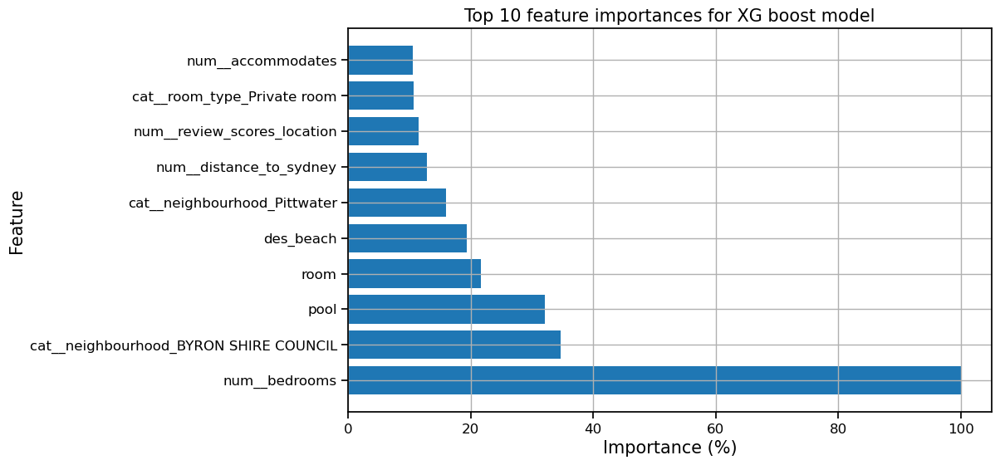

In [ ]:
# Get feature importances from the XG boost
xgb_feature_importances = pd.Series(100*(xgb_model.feature_importances_/np.max(xgb_model.feature_importances_)))

# Get the feature names
feature_names = X_train.columns.tolist()

# Create DataFrame to store feature names and importance
xgb_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': xgb_feature_importances})

# Sort the features by importance in descending order
xgb_feature_importance_df = xgb_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the top 10 most important feature
plt.figure(figsize=(10, 6))
plt.barh(xgb_feature_importance_df['Feature'][:10], xgb_feature_importance_df['Importance'][:10])
plt.xlabel('Importance (%)')
plt.ylabel('Feature')
plt.title('Top 10 feature importances for XG boost model')
plt.grid()
plt.show()

### Combine the base models to create the stacking regressor

In [ ]:
models = [('Lasso', lasso_model), ('Random Forest', rf_model), ('Gradient Boost', gb_model), ("XGBoost",xgb_model)]

stack_model = StackingRegressor(models, final_estimator=LinearRegression(positive=True), cv=5, verbose = 3)

stack_model.fit(X_train,y_train)

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.381e+07, tolerance: 4.124e+04
  model = cd_fast.enet_coordinate_descent(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.934e+06, tolerance: 3.355e+04
  model = cd_fast.enet_coordinate_descent(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s
/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628

StackingRegressor(cv=5,
                  estimators=[('Lasso', Lasso(alpha=0.03, random_state=0)),
                              ('Random Forest',
                               RandomForestRegressor(max_depth=30,
                                                     max_features='sqrt',
                                                     n_estimators=1000,
                                                     random_state=0)),
                              ('Gradient Boost',
                               HistGradientBoostingRegressor(l2_regularization=0.1,
                                                             learning_rate=0.05,
                                                             max_depth=30,
                                                             max_iter=500,
                                                             random_state=0)),
                              ('XGBoost',
                               XGBRegressor(base_score=...
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=5,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=600, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, ...))],
                  final_estimator=LinearRegression(positive=True), verbose=3)

#### Evaluate the stacking model performance on validation set

In [ ]:
# Make prediction
stack_pred = stack_model.predict(X_val)

stack_rmse = mean_squared_error(y_pred=stack_pred, y_true=y_val, squared= False)
print(f"Stacking model RMSE on validation set: {stack_rmse}")

Stacking model RMSE on validation set: 115.47185757737249


#### Stacking model training RMSE

In [ ]:
# Make prediction
stack_train_pred = stack_model.predict(X_train_complete)

stack_train_rmse = mean_squared_error(y_pred=stack_train_pred, y_true=y_train_complete, squared= False)
print(f"Stacking model training RMSE: {stack_train_rmse}")

Stacking model training RMSE: 72.58859088468445


#### Make prediction on test set for submission (Stack model)

In [ ]:
# Fit the stack model with the entire training set
stack_model.fit(X_train_complete,y_train_complete)

# Make prediction on Test set
stack_test_pred = stack_model.predict(X_test_complete)

# Create the submission csv file
id_col = np.arange(2500).reshape(-1, 1)
stack_test_pred= stack_test_pred.reshape(-1, 1)

stack_data = np.hstack((id_col, stack_test_pred))

stack_submission = pd.DataFrame(stack_data, columns=['id', 'price'])
stack_submission['id'] = stack_submission['id'].astype('int')

stack_submission.to_csv('stack_submission.csv', index=False)

/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.104e+07, tolerance: 5.064e+04
  model = cd_fast.enet_coordinate_descent(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.218e+07, tolerance: 4.080e+04
  model = cd_fast.enet_coordinate_descent(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s remaining:    0.0s
/Users/jeremiahs27/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628

#### Stack model interpretation

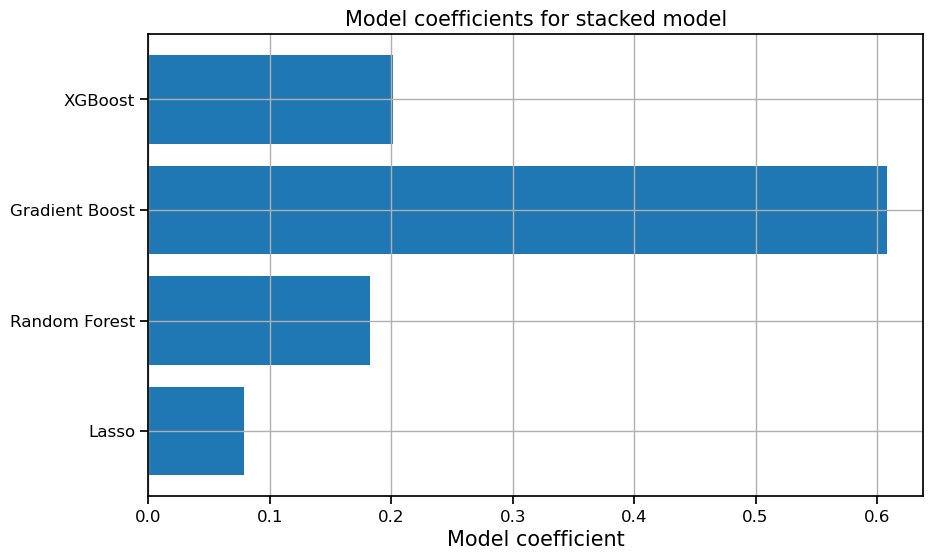

In [ ]:
plt.figure(figsize=(10, 6))
plt.barh(np.arange(len(models)), stack_model.final_estimator_.coef_)
plt.yticks(np.arange(len(models)), ['Lasso', 'Random Forest', 'Gradient Boost', 'XGBoost'])
plt.xlabel('Model coefficient')
plt.title('Model coefficients for stacked model')
plt.grid()
plt.show()